<a href="https://colab.research.google.com/github/cuongko/Capstone-Project-Notebook/blob/main/Model_build.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stock Price Prediction Models

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import sys
import math
import os

In [ ]:
# Let’s load the data and inspect them:
import math
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from keras.models import load_model

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline

In [ ]:
# declare constants
sc = MinMaxScaler(feature_range = (0, 1))
nd_trans = 5 # number of day transaction
predict_day = 3 # in the day T+3, stock comes to account
train_test_ratio = 0.7 # train set and test set ratio
data_path = '/content/drive/My Drive/Colab Notebooks/Stock historical data/Updated stock/'
model_path = '/content/drive/My Drive/Colab Notebooks/Stock historical data/My models/'

In [ ]:
def get_watchlist(data_path):
  '''
  get watch list from folder contains stock data file
  '''
  files = os.listdir(data_path)
  watchlist = []
  for file in files:
    if len(file)<=15:
      watchlist.append(file[8:11])
  
  return watchlist

In [ ]:
def spliting_data(df, train_days):
  '''
  spliting data into train set and test set
  '''
  
  training_set = df.iloc[:train_days, 1:].values
  test_set = df.iloc[train_days:, 1:].values
  
  return training_set, test_set


In [ ]:
def train_set_preparation(training_set, train_days, sc = sc, nd_trans = nd_trans , predict_day = predict_day):
  '''
  preparing X_train and y_train including data normalization
  '''
  # data normalization
  train_set_scaled = sc.fit_transform(training_set)

  # preparing X train, y train
  X_train = []
  y_train = []
  for i in range(nd_trans, train_days - predict_day):
    X_train.append(train_set_scaled[i - nd_trans : i, 0:])
    y_train.append(train_set_scaled[i + predict_day, 0])

  # convert X_train, y_train to array type
  X_train, y_train = np.array(X_train), np.array(y_train)
  X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 2))
  return X_train, y_train

In [ ]:
def test_set_preparation(test_set, train_days, nd_trans = nd_trans, predict_day = predict_day, sc = sc):
  '''
  preparing test set to compare y true with y predict
  '''
  # y_true
  y_true = []
  y_true_date = [] 
  for i in range(nd_trans, len(test_set) - predict_day):
    y_true.append(test_set[i + predict_day, 0])
    y_true_date.append(df.iloc[train_days + i + predict_day, 0])

  # X_test 
  # normalization test set
  test_set_scaled = sc.fit_transform(test_set) 
  # prepare X_test
  X_test = []
  for i in range(nd_trans, len(test_set) - predict_day):
    X_test.append(test_set_scaled[i - nd_trans : i, 0:])
  
  # convert X_test, y_true to array type
  X_test, y_true = np.array(X_test), np.array(y_true)
  X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 2)) # 2 is number of features

  return X_test, y_true, y_true_date

In [ ]:
def predict_ytest(model,X_test):
  predicted_stock_price = model.predict(X_test)
  prd_price = np.array([[1,0]]) # transform predicted_stock_price to shape (x,6)
  predicted_stock_price = sc.inverse_transform(predicted_stock_price.dot(prd_price))
  prd = []
  for i in range(0, len(predicted_stock_price)):
    prd.append(predicted_stock_price[i][0])
  prd = np.array(prd)
  return prd

In [ ]:
# Visualising the results
def ploting_ypredict_ytrue(y_true_date, prd, y_true, ticker):
  plt.plot(np.array(y_true_date) , prd , color = 'blue', label = 'Predicted {} Stock Price'.format(ticker))
  plt.plot(np.array(y_true_date), y_true, color = 'red', label = 'Real {} Stock Price'.format(ticker))
  plt.title('{} Stock Price Prediction'.format(ticker))
  plt.xlabel('Time')
  plt.ylabel('{} Stock Price'.format(ticker))
  plt.legend()
  plt.show()

In [ ]:
def existing_models(path):
  '''
  Return models built
  '''
  existing_models = []
  for file_name in os.listdir(path):
    existing_models.append(file_name[:3])
  return existing_models

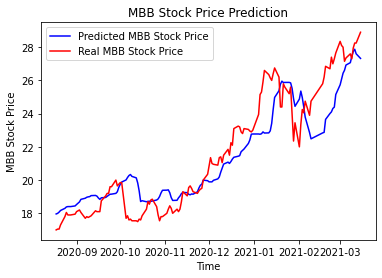

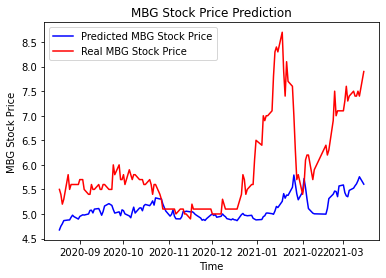

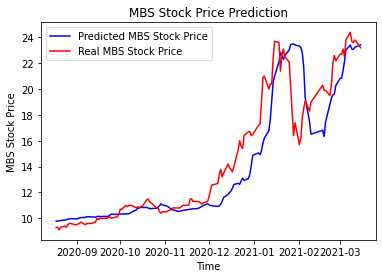

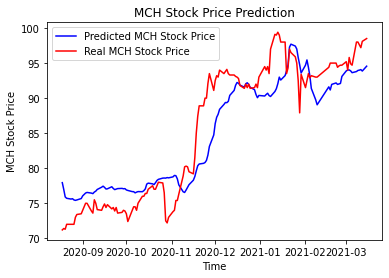

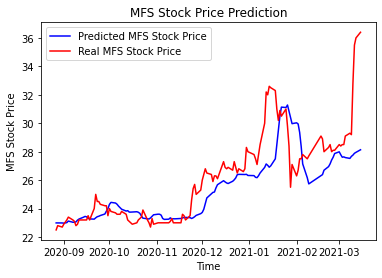

...

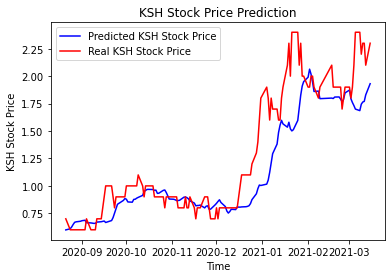

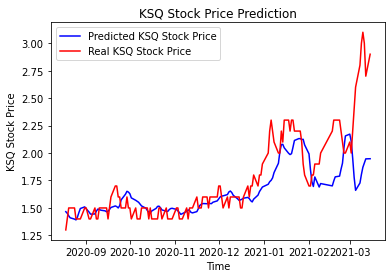

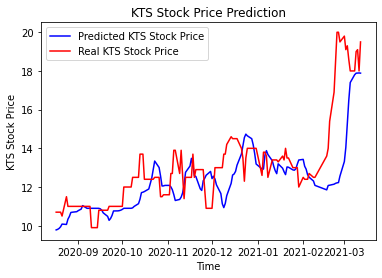

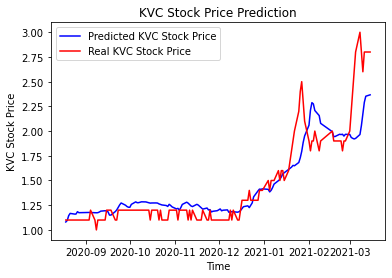

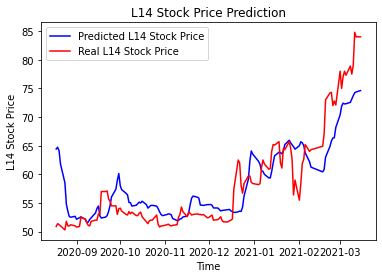

In [ ]:
existing_models = existing_models(model_path)
watchlist = get_watchlist(data_path = data_path)

for ticker in watchlist:
  if ticker not in  existing_models: # do not rebuil existing model
    # Read file csv to a df and arrange ascending by Date
    df = pd.read_csv(data_path + 'HisData_' + ticker + '.csv')
    if len(df) > 100: # do not build if there are few transaction days
      # reorder df columns
      columns_order = ['Date',	'PriceClose', 'DealVolume']	#,'PriceHigh',	'PriceLow',	'PriceOpen',	'PutthroughVolume']
      df = df[columns_order]
      df['Date'] = pd.to_datetime(df['Date'])
      df = df.sort_values(by = 'Date', ascending = True)

      train_days = int(len(df) * train_test_ratio) # number of days to use as train set
  
      # spliting data
      training_set, test_set = spliting_data(df = df, train_days = train_days)

      # preparing X train, y train
      # data normalization
      X_train, y_train = train_set_preparation(training_set = training_set, train_days = train_days)

      # prepare X_test, y_test
      X_test, y_true, y_true_date = test_set_preparation(test_set = test_set, train_days = train_days)

      # Creating model
      model = Sequential()
      #Adding the first LSTM layer and some Dropout regularisation
      model.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 2)))
      model.add(Dropout(0.2))
      # Adding a second LSTM layer and some Dropout regularisation
      model.add(LSTM(units = 50, return_sequences = True))
      model.add(Dropout(0.2))
      # Adding a third LSTM layer and some Dropout regularisation
      model.add(LSTM(units = 50, return_sequences = True))
      model.add(Dropout(0.2))
      # Adding a fourth LSTM layer and some Dropout regularisation
      model.add(LSTM(units = 50))
      model.add(Dropout(0.2))
      # Adding the output layer
      model.add(Dense(units = 1))

      # Compiling the RNN
      model.compile(optimizer = 'adam', loss = 'mean_squared_error')

      # Fitting the RNN to the Training set
      model.fit(X_train, y_train, epochs = 100, batch_size = 32, verbose = 0)

      # Saving model
      model.save(model_path + ticker + '.h5')  # creates a HDF5 file 'my_model.h5'
  
      # Predicting in test set
      prd = predict_ytest(model = model, X_test = X_test)
  
      # Visualization
      ploting_ypredict_ytrue(y_true_date = y_true_date, prd = prd, y_true = y_true, ticker = ticker)
      del model